In [1]:
import numpy as np
import scipy as sp
import pandas as pd
import sklearn as skl
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
import gc
import sys
import os
import tqdm
import collections
import re
import correlation_data_utilities
import networkx as nx
from itertools import islice
from itertools import combinations
import copy
import subprocess

import pytraj as pt

import importlib

Loading BokehJS ...

# Load trajectories
We are using pytraj to load each trajectory as a 'pytraj.TrajectoryIterator' object. This actually just loads
pointers to the files themselves that pytraj can use to process the trajectories, so we can handle large
numbers of relatively large files this way if needed (provided that each individual file will fit in memory)

The method presented below will use each trajectory one at a time and extract the needed information.
In the case where the trajectories are so large that even individual trajectories won't fit in memory, an
alternative approach may be needed. E.g. the trajectories could be cut into smaller portions (subtrajectoris). 
Each subtrajectory would be processed individual and the results merged together.

In [2]:
energyDataDir='distance_topology'
systems=['igps']
variants=['apo','holo']

trajectoryFileName='_MMPBSA_complex.mdcrd.0'
topologyFileName='_MMPBSA_complex.pdb'

nSkip_Summary=6
headerRows_Summary=[0,1]

subDirStr='{system}.{variant}'

trajDict={}
for system in systems:
    for variant in variants:
        trajKey=subDirStr.format(system=system,variant=variant)
        trajDir='/'.join([energyDataDir,trajKey])
        trajFilePath='/'.join([trajDir,trajectoryFileName])
        topFilePath='/'.join([trajDir,topologyFileName])
        trajDict[trajKey]=pt.iterload(trajFilePath,top=topFilePath)
        print(trajKey,':',trajDict[trajKey])

igps.apo : pytraj.TrajectoryIterator, 50 frames: 
Size: 0.008075 (GB)
<Topology: 7225 atoms, 456 residues, 4 mols, non-PBC>
           
igps.holo : pytraj.TrajectoryIterator, 50 frames: 
Size: 0.008137 (GB)
<Topology: 7281 atoms, 455 residues, 3 mols, non-PBC>
           


## Compute coarse 'collision count matrices' as a first pass filter
The pairwise distance topologies we will be computing here require calculating the minimum inter-atomic
distance between atoms of the two residues at every frame. While this is not time consuming for the trajectories
used in this example, it can become very computational expensive for larger systems and trajectory lengths.

In anticipation of this, we include here a 'bounding box collision' based algorithm that can be used to filter out
residues that are too distant to be relevant. This algorithm works by computing the minimum and maximum observed
atomic coordinates for each residue at each frame. These min-max coordinate sets can then serve as the bounds of
a 'bounding box' which encompases the residue. These bounding boxes are then 'padded'. I.e. a the minima are
reduced by a specified amount (dubbed the 'collision radius') and the maxima increased by the same fixed amount. 
The resulting padded bounding boxes are then used to check for 'collisions' between pairs of residues. I.e. if the bounding boxes of two
residues overlap, then a 'collision' has occured. The'collision radius' serves as a cutoff to filter out 
residues for which it will be guaranteed that the minimum interatomic separation is never less than the 
bounding box collision radius. I.e. if the padded bounding boxes for a pair of residues never collide, then
that residue pair will never have their atoms get closer than the collision radius.

The benefit to this bounding box collision method is that it is many times faster than computing pairwise
distances.

In [3]:
collisionMatDict={}
nRes=454
collisionRad=8.0
for trajKey in trajDict:
    print("Working on %s"%trajKey)
    traj=trajDict[trajKey]
    resAtomInds=np.array([traj.topology.atom_indices(':{:g}'.format(iRes+1)) \
                 for iRes in np.arange(nRes)])
    collisionMatDict[trajKey]=correlation_data_utilities.compute_BoxCollision_CountMatrix(
        traj,collisionRadius=collisionRad,resinds=resAtomInds,
        showProgress=True)
    print("--- --- ---")
    
collisionMatDict

Working on igps.apo



--- --- ---
Working on igps.holo



--- --- ---


{'igps.apo': <454x454 sparse matrix of type '<class 'numpy.int64'>'
 	with 205662 stored elements in COOrdinate format>,
 'igps.holo': <454x454 sparse matrix of type '<class 'numpy.int64'>'
 	with 205662 stored elements in COOrdinate format>}

# Visualize Bounding Box Collision Matrices

The bounding box collision count matrices generated can give us a rough idea of what our network topology will look like.

Using the 'bokeh' package we can view them in an interactive manner, allowing us to zoom or pan to regions of interest and to query the individual matrix entries to get the exact coordinate (resid pair) and value
(collision count)

In [4]:
collisionCountFrames=[]
for trajKey in collisionMatDict:
    tempMat=collisionMatDict[trajKey]
    nzInds=np.nonzero(tempMat)
    counts=np.array(tempMat.tocsr()[nzInds]).flatten()
    tempFrame=pd.DataFrame({
        'System':[trajKey]*len(nzInds[0]),
        'Radius':[collisionRad]*len(nzInds[0]),
        'X':nzInds[0],
        'Y':nzInds[1],
        'Collisions':counts
    })
    nColors=len(np.unique(counts))
    nColors=nColors if nColors < 256 else 256
    colormap=sns.color_palette("plasma", n_colors=nColors).as_hex()
    correlation_data_utilities.bokeh_interactive_matrix_plot(
        tempMat.tocsr(),nonzero_only=True,plotWidth=640,plotHeight=640,
        colorMap=colormap,
        vmax=np.max(counts),vmin=0,title=trajKey)
    collisionCountFrames.append(tempFrame.copy())
    gc.collect()
collisionCountFrame=pd.concat(collisionCountFrames)
collisionCountFrames=[]
collisionCountFrame.head()

,System,Radius,X,Y,Collisions
0,igps.apo,8.0,0,1,50
1,igps.apo,8.0,0,2,50
2,igps.apo,8.0,0,3,50
3,igps.apo,8.0,0,4,50
4,igps.apo,8.0,0,5,50


## Save collision data to disk in data table format

In [5]:
outDir='distance_topology'
outFileName='collision_data_table.csv'
outFilePath='/'.join([outDir,outFileName])
collisionCountFrame.to_csv(outFilePath,index=False)

# Generate Pairwise distances using box collision data as a first pass filter

## load collision data table

In [6]:
distDataDir='distance_topology'
collisionDataFileName='collision_data_table.csv'
collisionDataFilePath='/'.join([distDataDir,collisionDataFileName])
collisionCountFrame=pd.read_csv(collisionDataFilePath)
collisionCountFrame.head()

,System,Radius,X,Y,Collisions
0,igps.apo,8.0,0,1,50
1,igps.apo,8.0,0,2,50
2,igps.apo,8.0,0,3,50
3,igps.apo,8.0,0,4,50
4,igps.apo,8.0,0,5,50


## Use collision data to filter residue pairs

Since we ultimately would like to look for differences between the two states (apo and holo) we should be sure
to include any residue pairs that showed up in our collision data for either system. This can be easily
accomplished using the pandas groupby and aggregate functions

In [7]:
minCollisions=1
collisionPairFrame=collisionCountFrame[['X','Y','Collisions']].groupby(['X','Y']).agg(
    np.max).reset_index()
collisionPairFrame=collisionPairFrame[collisionPairFrame['Collisions']>=minCollisions]
nColors=len(collisionPairFrame['Collisions'].unique())
nColors=nColors if nColors < 256 else 256
colormap=sns.color_palette("plasma", n_colors=nColors).as_hex()
maxCollisionMat=sp.sparse.coo_matrix(
        (collisionPairFrame['Collisions'],
         (collisionPairFrame['X'],collisionPairFrame['Y'])),
        shape=(nRes,nRes)
    )
correlation_data_utilities.bokeh_interactive_matrix_plot(
    maxCollisionMat.tocsr(),
    colorMap=colormap,
    title='Residue Pair Maximum Collisions Over All Systems')

In [8]:
collisionPairs=np.array(collisionPairFrame[['X','Y']])
seriesDataSubDir='minimumDistanceSeriesData'
outDir='/'.join([distDataDir,seriesDataSubDir])
resPairFileName='collisionPairs.txt'
print("Saving Collision Pair List")
resPairFilePath='/'.join([distDataDir,seriesDataSubDir,resPairFileName])
np.savetxt(fname=resPairFilePath,X=collisionPairs)
minDistDataDict={}
for trajKey in collisionCountFrame['System'].unique():
    traj=trajDict[trajKey]
    outFileName='.'.join([trajKey,'minimumDistanceData.txt'])
    outFilePath='/'.join([outDir,outFileName])
    print("Generating Minimum Distance Data Series for %s"%trajKey)
    print("-Data will be saved to:",outFilePath)
    minDistDataDict[trajKey]=correlation_data_utilities.compute_pairwise_minDist_data(
        traj,
        resindexpairs=collisionPairs,
        chunkSize=1000,
        outFilePath=outFilePath,
        returnData=True,
        showProgress=True)
minDistDataDict

Saving Collision Pair List
Generating Minimum Distance Data Series for igps.apo
-Data will be saved to: distance_topology/minimumDistanceSeriesData/igps.apo.minimumDistanceData.txt



Generating Minimum Distance Data Series for igps.holo
-Data will be saved to: distance_topology/minimumDistanceSeriesData/igps.holo.minimumDistanceData.txt


{'igps.apo': array([[1.3381334 , 1.37703849, 1.35107698, ..., 1.32660393, 1.31712528,
         1.34781675],
        [4.13084858, 3.67602503, 4.02180034, ..., 3.48114852, 3.37930185,
         3.80173789],
        [4.14884273, 3.42244985, 2.74333957, ..., 3.55547718, 5.61376781,
         5.93923901],
        ...,
        [4.34970735, 7.1000088 , 2.69295915, ..., 4.85140742, 5.75276577,
         6.0841181 ],
        [4.66281557, 3.68379003, 4.81426225, ..., 2.14928779, 2.179293  ,
         2.54624704],
        [1.3317725 , 1.30395936, 1.34889659, ..., 1.37670948, 1.38463208,
         1.35909566]]),
 'igps.holo': array([[1.41088235, 1.3783559 , 1.32738126, ..., 1.34693207, 1.35047288,
         1.37523598],
        [3.47692134, 3.51184296, 3.40792562, ..., 3.70921501, 3.52611131,
         3.25871953],
        [3.09316763, 3.09697933, 3.14440853, ..., 3.27243839, 2.86638466,
         4.74461126],
        ...,
        [5.44783315, 5.19496728, 5.28056749, ..., 5.68588401, 5.56432539,
         

In [9]:
#For github, file size is limited to 100MB or less... this is a problem for
#our pairwise distance series data, which can be large even for a relatively
#small system like this. In order to make these files tractable, we will
#'split' them. This uses a unix specific file command so windows users may need
#to find an alternative. Visual Studio Code is one possibility since it contains
#a unix terminal plugin that could perform the splitting, though you will still
#need to do so by hand.
#The subsequent cell will load the split data files.
#If large filesize is not an issue you may skip these two cells and load the full files
#(if you created them)
seriesDataSubDir='minimumDistanceSeriesData'
outDir='/'.join([distDataDir,seriesDataSubDir])
chunkLineCount=5000

for trajKey in minDistDataDict:
    distSeries=minDistDataDict[trajKey]
    distSeriesFileName='.'.join([trajKey,'minimumDistanceData.txt'])
    distSeriesFilePath='/'.join([outDir,distSeriesFileName])
    splitFileNameBase='.'.join([trajKey,'minimumDistanceData.chunk_'])
    splitFilePathBase='/'.join([outDir,splitFileNameBase])
    print("Splitting Minimum Distance Data Series for %s"%trajKey)
    print("-Data will be saved to:",splitFilePathBase)
    splitCall=['split','-l {nLines:g}'.format(nLines=chunkLineCount),
                    distSeriesFilePath,splitFilePathBase]
    print("Splitting call =",splitCall)
    subprocess.call(splitCall)
print("Done splitting distance data series'")

Splitting Minimum Distance Data Series for igps.apo
-Data will be saved to: distance_topology/minimumDistanceSeriesData/igps.apo.minimumDistanceData.chunk_
Splitting call = ['split', '-l 5000', 'distance_topology/minimumDistanceSeriesData/igps.apo.minimumDistanceData.txt', 'distance_topology/minimumDistanceSeriesData/igps.apo.minimumDistanceData.chunk_']
Splitting Minimum Distance Data Series for igps.holo
-Data will be saved to: distance_topology/minimumDistanceSeriesData/igps.holo.minimumDistanceData.chunk_
Splitting call = ['split', '-l 5000', 'distance_topology/minimumDistanceSeriesData/igps.holo.minimumDistanceData.txt', 'distance_topology/minimumDistanceSeriesData/igps.holo.minimumDistanceData.chunk_']
Done splitting distance data series'


In [10]:
#Load split data files.
#If you have full data series files, by default we will use a multifile loader
#since the github repo will store them this way. If you have created full distance
#series files then you can use the simpler loader command in the cell below instead

#This is a general purpose loader for array files that have been split into
#multiple pieces. It assumes that the files are indexed in a lexigraphical order
#The default loader loads numpy arrays saved using np.savetxt
#you can pass any needed arguments using the 'kwargs' argument. Note that these
#will be passed to every file loaded. If you need something more complex you will
#have to code it by hand.
def load_split_numpy_text_array(dataDirectory,fileNamePattern,
                                arrayLoader=np.loadtxt,
                                showProgress=False,
                                verbose=False,**kwargs):
    fileList=np.sort([fileName for fileName in os.listdir(dataDirectory) \
                      if fileNamePattern in fileName])
    if verbose:
        print("file list:",fileList)
    arrayList=[]
    if showProgress:
        fileIter=tqdm.tqdm_notebook(fileList,desc='loading array chunks')
    else:
        fileIter=fileList
        
    for fileName in fileIter:
        filePath='/'.join([dataDirectory,fileName])
        arrayList.append(arrayLoader(filePath,**kwargs))
    return(np.concatenate(arrayList,axis=0))

distDataDir='distance_topology'
seriesDataSubDir='minimumDistanceSeriesData'
dataDir='/'.join([distDataDir,seriesDataSubDir])

resPairFileName=resPairFileName='collisionPairs.txt'
resPairFilePath='/'.join([dataDir,resPairFileName])
collisionPairs=np.loadtxt(resPairFilePath)

systems=['igps']
variants=['apo','holo']
seriesDataPattern='minimumDistanceData.chunk_'

minDistDataDict={}
for system in systems:
    for variant in variants:
        dataKey='.'.join([system,variant])
        filePattern='.'.join([dataKey,seriesDataPattern])
        print("loading array data for {:s}".format(dataKey))
        minDistDataDict[dataKey]=copy.deepcopy(
            load_split_numpy_text_array(dataDir,filePattern,
                                        verbose=True,showProgress=True))
minDistDataDict

loading array data for igps.apo
file list: ['igps.apo.minimumDistanceData.chunk_aa'
 'igps.apo.minimumDistanceData.chunk_ab'
 'igps.apo.minimumDistanceData.chunk_ac' ...
 'igps.apo.minimumDistanceData.chunk_ar'
 'igps.apo.minimumDistanceData.chunk_as'
 'igps.apo.minimumDistanceData.chunk_at']



loading array data for igps.holo
file list: ['igps.holo.minimumDistanceData.chunk_aa'
 'igps.holo.minimumDistanceData.chunk_ab'
 'igps.holo.minimumDistanceData.chunk_ac' ...
 'igps.holo.minimumDistanceData.chunk_ar'
 'igps.holo.minimumDistanceData.chunk_as'
 'igps.holo.minimumDistanceData.chunk_at']


{'igps.apo': array([[1.3381334 , 1.37703849, 1.35107698, ..., 1.32660393, 1.31712528,
         1.34781675],
        [4.13084858, 3.67602503, 4.02180034, ..., 3.48114852, 3.37930185,
         3.80173789],
        [4.14884273, 3.42244985, 2.74333957, ..., 3.55547718, 5.61376781,
         5.93923901],
        ...,
        [4.34970735, 7.1000088 , 2.69295915, ..., 4.85140742, 5.75276577,
         6.0841181 ],
        [4.66281557, 3.68379003, 4.81426225, ..., 2.14928779, 2.179293  ,
         2.54624704],
        [1.3317725 , 1.30395936, 1.34889659, ..., 1.37670948, 1.38463208,
         1.35909566]]),
 'igps.holo': array([[1.41088235, 1.3783559 , 1.32738126, ..., 1.34693207, 1.35047288,
         1.37523598],
        [3.47692134, 3.51184296, 3.40792562, ..., 3.70921501, 3.52611131,
         3.25871953],
        [3.09316763, 3.09697933, 3.14440853, ..., 3.27243839, 2.86638466,
         4.74461126],
        ...,
        [5.44783315, 5.19496728, 5.28056749, ..., 5.68588401, 5.56432539,
         

In [105]:
#If you saved the files in single chunks you can load them by uncommenting
#and running the code below:


#distDataDir='distance_topology'
#seriesDataSubDir='minimumDistanceSeriesData'
#dataDir='/'.join([distDataDir,seriesDataSubDir])
#
#resPairFileName=resPairFileName='collisionPairs.txt'
#resPairFilePath='/'.join([dataDir,resPairFileName])
#collisionPairs=np.loadtxt(resPairFilePath)
#
#systems=['igps']
#variants=['apo','holo']
#seriesDataPattern='minimumDistanceData.txt'
#
#minDistDataDict={}
#for system in systems:
#    for variant in variants:
#        dataKey='.'.join([system,variant])
#        fileName='.'.join([dataKey,seriesDataPattern])
#        filePath='/'.join([dataDir,fileName])
#        print("loading array data for {:s}".format(dataKey))
#        minDistDataDict[dataKey]=copy.deepcopy(np.loadtxt(filePath))
#minDistDataDict

loading array data for igps.apo
loading array data for igps.holo


{'igps.apo': array([[1.3381334 , 1.37703849, 1.35107698, ..., 1.32660393, 1.31712528,
         1.34781675],
        [4.13084858, 3.67602503, 4.02180034, ..., 3.48114852, 3.37930185,
         3.80173789],
        [4.14884273, 3.42244985, 2.74333957, ..., 3.55547718, 5.61376781,
         5.93923901],
        ...,
        [4.34970735, 7.1000088 , 2.69295915, ..., 4.85140742, 5.75276577,
         6.0841181 ],
        [4.66281557, 3.68379003, 4.81426225, ..., 2.14928779, 2.179293  ,
         2.54624704],
        [1.3317725 , 1.30395936, 1.34889659, ..., 1.37670948, 1.38463208,
         1.35909566]]),
 'igps.holo': array([[1.41088235, 1.3783559 , 1.32738126, ..., 1.34693207, 1.35047288,
         1.37523598],
        [3.47692134, 3.51184296, 3.40792562, ..., 3.70921501, 3.52611131,
         3.25871953],
        [3.09316763, 3.09697933, 3.14440853, ..., 3.27243839, 2.86638466,
         4.74461126],
        ...,
        [5.44783315, 5.19496728, 5.28056749, ..., 5.68588401, 5.56432539,
         

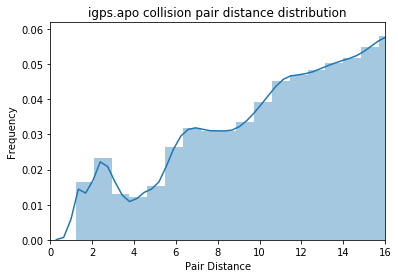

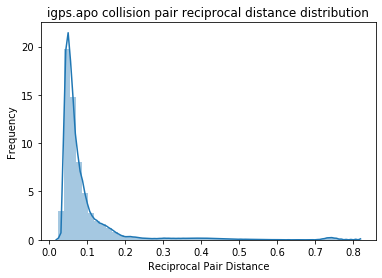

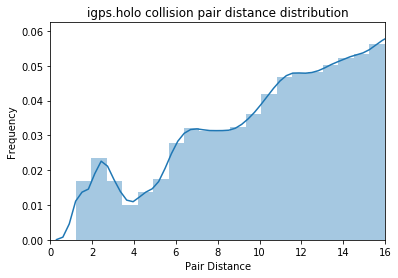

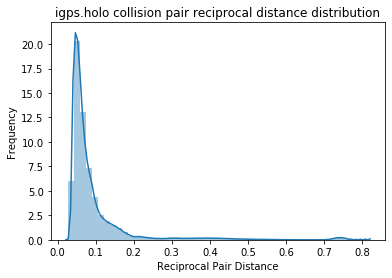

In [11]:
for trajKey in minDistDataDict:
    sns.distplot(minDistDataDict[trajKey].flatten())
    plt.title(trajKey+' collision pair distance distribution')
    plt.xlim(0,2*collisionRad)
    plt.xlabel('Pair Distance')
    plt.ylabel('Frequency')
    plt.show()
    
    sns.distplot(minDistDataDict[trajKey].flatten()**-1)
    plt.title(trajKey+' collision pair reciprocal distance distribution')
    plt.xlabel('Reciprocal Pair Distance')
    plt.ylabel('Frequency')
    plt.show()

In [15]:
contactFreqMatDict={}
meanDistDict={}
cutDist=collisionRad
colormap=sns.color_palette("plasma", n_colors=256).as_hex()
collisionPairs=np.array(collisionPairs,dtype=int)
for trajKey in minDistDataDict:
    minDistData=minDistDataDict[trajKey]
    contactFrequencies=np.mean(minDistData<=cutDist,axis=1)
    contactMat=sp.sparse.coo_matrix(
        (contactFrequencies,
         (collisionPairs[:,0],
          collisionPairs[:,1])))
    contactFreqMatDict[trajKey]=copy.deepcopy(contactMat.todense())
    
    correlation_data_utilities.bokeh_interactive_matrix_plot(
        contactMat.todense(),colorMap=colormap,
        title=trajKey+' contact frequency',vmin=0,vmax=1)
    
    meanDistData=np.mean(minDistData,axis=1)
    meanDistMat=sp.sparse.coo_matrix(
        (meanDistData,
         (collisionPairs[:,0],collisionPairs[:,1])))
    meanDistDict[trajKey]=copy.deepcopy(meanDistMat.todense())
    nzInds=np.nonzero(meanDistMat)
    plotMat=np.array(meanDistMat.todense())
    plotMat[nzInds]=plotMat[nzInds]**-1.
    correlation_data_utilities.bokeh_interactive_matrix_plot(
        plotMat,colorMap=colormap,
        title=trajKey+' mean reciprocal distance',vmin=0)
    
contactFreqMatDict

{'igps.apo': matrix([[0., 1., 1., ..., 0., 0., 0.],
         [1., 0., 1., ..., 0., 0., 0.],
         [1., 1., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 1., 1.],
         [0., 0., 0., ..., 1., 0., 1.],
         [0., 0., 0., ..., 1., 1., 0.]]),
 'igps.holo': matrix([[0., 1., 1., ..., 0., 0., 0.],
         [1., 0., 1., ..., 0., 0., 0.],
         [1., 1., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 1., 1.],
         [0., 0., 0., ..., 1., 0., 1.],
         [0., 0., 0., ..., 1., 1., 0.]])}

In [16]:
outDir='distance_topology'
freqCut=.75
#note that these files will have a header consistent with
#the 'NetworkView' plugin for VMD
for trajKey in contactFreqMatDict:
    mat=contactFreqMatDict[trajKey]
    outFileName='.'.join([trajKey,'contactFrequency.dat'])
    outFilePath='/'.join([outDir,outFileName])
    correlation_data_utilities.write_mat_to_carma_matrix(filepath=outFilePath,mat=mat,verbose=True)
    
    outFileName='.'.join([trajKey,'contact.dat'])
    outFilePath='/'.join([outDir,outFileName])
    correlation_data_utilities.write_mat_to_carma_matrix(
        filepath=outFilePath,
        mat=np.array(1.0*(mat>freqCut),dtype=int),verbose=True)
    
    outFileName='.'.join([trajKey,'meanDistance.dat'])
    outFilePath='/'.join([outDir,outFileName])
    mat=meanDistDict[trajKey]
    correlation_data_utilities.write_mat_to_carma_matrix(
        filepath=outFilePath,
        mat=mat,verbose=True)

Writting carma matrix format file: distance_topology/igps.apo.contactFrequency.dat
Writting header
Writting 454 rows:  0.0%  
done
Writting carma matrix format file: distance_topology/igps.apo.contact.dat
Writting header
Writting 454 rows:  0.0%  
done
Writting carma matrix format file: distance_topology/igps.apo.meanDistance.dat
Writting header
Writting 454 rows:  0.0%  
done
Writting carma matrix format file: distance_topology/igps.holo.contactFrequency.dat
Writting header
Writting 454 rows:  0.0%  
done
Writting carma matrix format file: distance_topology/igps.holo.contact.dat
Writting header
Writting 454 rows:  0.0%  
done
Writting carma matrix format file: distance_topology/igps.holo.meanDistance.dat
Writting header
Writting 454 rows:  0.0%  
done
